In [ ]:
! python3 -m pip install xgboost

In [ ]:
pip install pandas-profiling

In [ ]:
pip install hyperopt==0.2.5

In [ ]:
pip install hpsklearn

In [ ]:
pip install pyqt5

In [ ]:
pip install imblearn

In [93]:
# Basics
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb

# Tools from sklearn
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, StratifiedKFold
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score
from pandas_profiling import ProfileReport
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.neural_network import MLPClassifier
from imblearn.over_sampling import SMOTE
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from scipy.stats import randint as sp_randint

# HyperOpt
from hpsklearn import HyperoptEstimator
from hpsklearn import any_classifier
from hpsklearn import any_preprocessing
from hyperopt import tpe

## Kaggle

In [ ]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
df = pd.read_csv('../input/stellar-classification-dataset-sdss17/star_classification.csv')

## Desktop

In [2]:
df = pd.read_csv("../desktop/star_classification.csv")
df

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,1.237679e+18,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,7778,301,2,581,1.055431e+19,GALAXY,0.000000,9374,57749,438
99996,1.237679e+18,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,7917,301,1,289,8.586351e+18,GALAXY,0.404895,7626,56934,866
99997,1.237668e+18,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,5314,301,4,308,3.112008e+18,GALAXY,0.143366,2764,54535,74
99998,1.237661e+18,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,3650,301,4,131,7.601080e+18,GALAXY,0.455040,6751,56368,470


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   obj_ID       100000 non-null  float64
 1   alpha        100000 non-null  float64
 2   delta        100000 non-null  float64
 3   u            100000 non-null  float64
 4   g            100000 non-null  float64
 5   r            100000 non-null  float64
 6   i            100000 non-null  float64
 7   z            100000 non-null  float64
 8   run_ID       100000 non-null  int64  
 9   rerun_ID     100000 non-null  int64  
 10  cam_col      100000 non-null  int64  
 11  field_ID     100000 non-null  int64  
 12  spec_obj_ID  100000 non-null  float64
 13  class        100000 non-null  object 
 14  redshift     100000 non-null  float64
 15  plate        100000 non-null  int64  
 16  MJD          100000 non-null  int64  
 17  fiber_ID     100000 non-null  int64  
dtypes: float64(10), int64(7),

# Data Profile

In [4]:
profile = ProfileReport(df, title="Star Classification Dataset Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 3.2	Pre-processing and feature extraction steps

# Feature Selection

In [4]:
predictor_variables = ["alpha", "delta", "u", "g", "r", "i", "z", "redshift", "plate", "MJD"]
response_variables = ["class"]
X = df[predictor_variables]
y = df[response_variables]

In [5]:
print(y)
print(y.shape)

        class
0      GALAXY
1      GALAXY
2      GALAXY
3      GALAXY
4      GALAXY
...       ...
99995  GALAXY
99996  GALAXY
99997  GALAXY
99998  GALAXY
99999  GALAXY

[100000 rows x 1 columns]
(100000, 1)


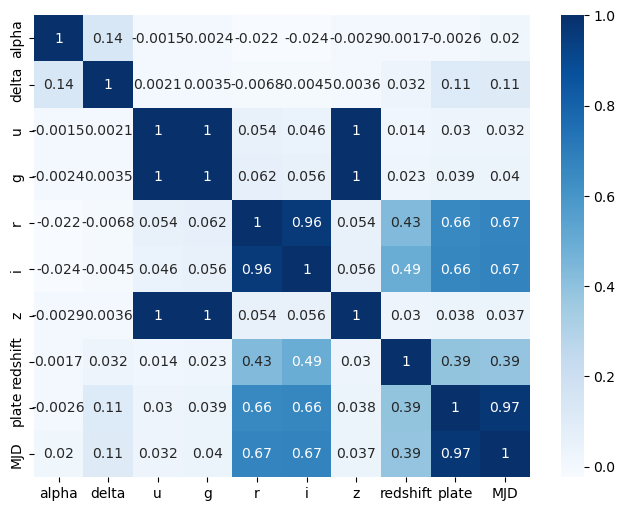

In [6]:
plt.figure(figsize=(8,6))
sns.heatmap(X.corr(),annot=True,cmap="Blues");

## Outliers

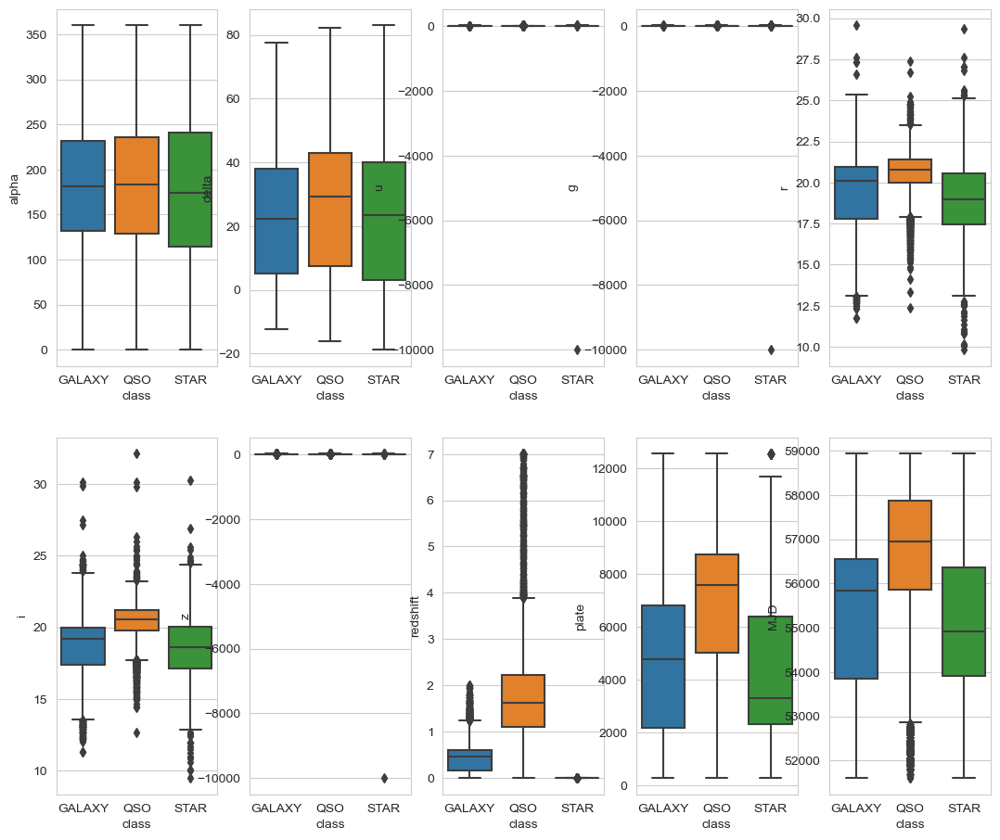

In [7]:
sns.set_style("whitegrid")
plt.figure(figsize=(13,11)) 
for i in range(1,11):
    f=plt.subplot(2,5,i)
    sns.boxplot(x = 'class', y = predictor_variables[i-1], data = df)

In [8]:
outlier = df.query('u < 0 or g < 0 or r < 0 or i < 0 or z < 0')
outlier

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
79543,1.237649e+18,224.006526,-0.624304,-9999.0,-9999.0,18.1656,18.01675,-9999.0,752,301,2,537,3.731277e+18,STAR,0.000089,3314,54970,162


In [9]:
df = df.drop(79543)
df

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,1.237679e+18,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,7778,301,2,581,1.055431e+19,GALAXY,0.000000,9374,57749,438
99996,1.237679e+18,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,7917,301,1,289,8.586351e+18,GALAXY,0.404895,7626,56934,866
99997,1.237668e+18,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,5314,301,4,308,3.112008e+18,GALAXY,0.143366,2764,54535,74
99998,1.237661e+18,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,3650,301,4,131,7.601080e+18,GALAXY,0.455040,6751,56368,470


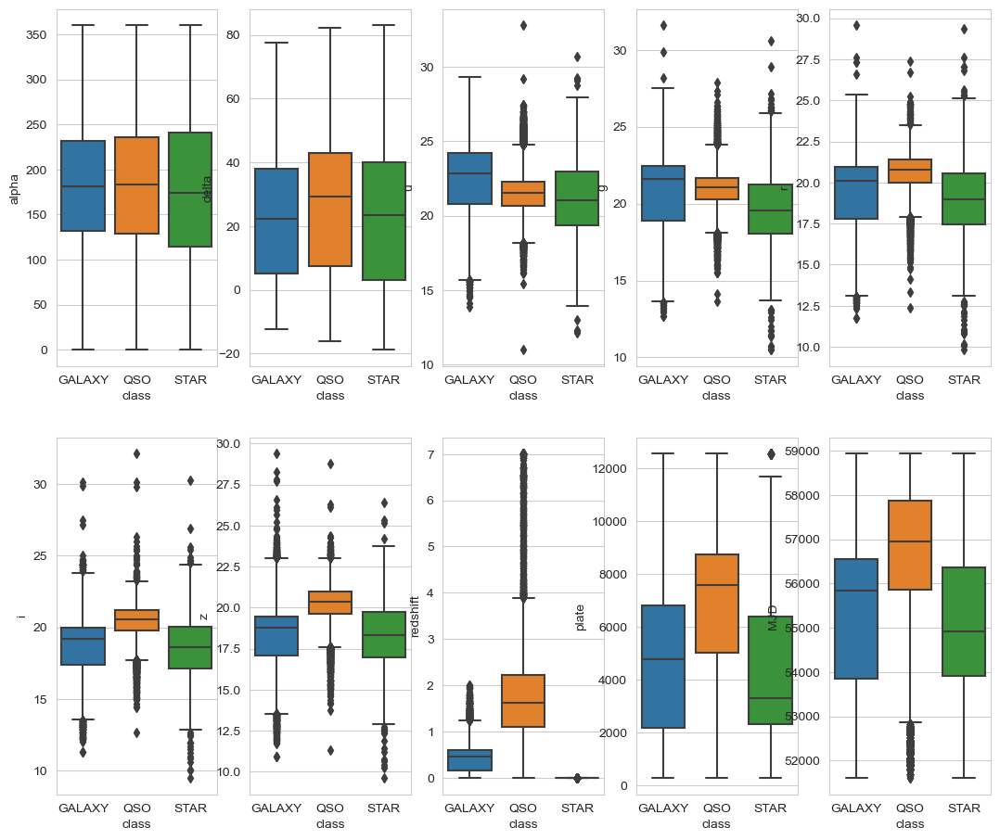

In [10]:
sns.set_style("whitegrid")
plt.figure(figsize=(13,11)) 
for i in range(1,11):
    f=plt.subplot(2,5,i)
    sns.boxplot(x = 'class', y = predictor_variables[i-1], data = df)

<AxesSubplot:title={'center':'redshift'}, xlabel='class'>

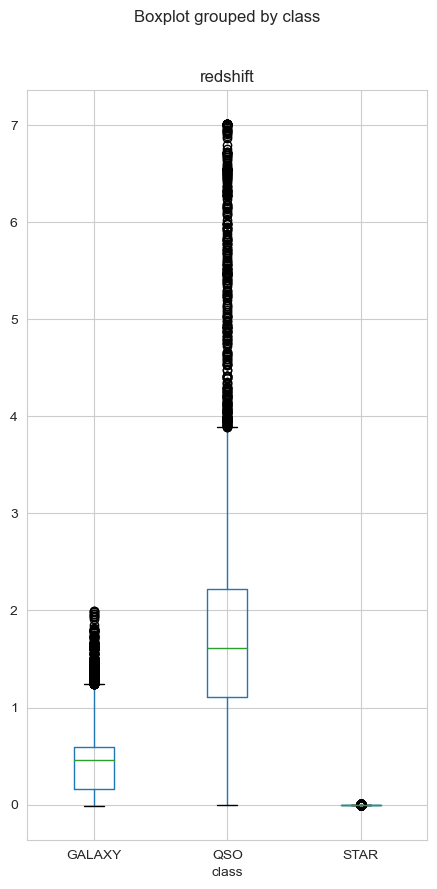

In [11]:
df.boxplot(column = 'redshift',by='class',figsize=(5,10))

In [12]:
# selecting rows based on condition 
option = ['QSO'] 
rslt_df = df[(df['class'].isin(option))] 
# standar deviation methadology
df_std= pd.DataFrame(rslt_df,columns=["redshift"])
lower_limit = df_std.mean() - 3*df_std.std()
upper_limit = df_std.mean() + 3*df_std.std()
print(lower_limit)
print(upper_limit)
df_std

redshift   -1.022187
dtype: float64
redshift    4.461539
dtype: float64


,redshift
5,1.424659
6,0.586455
17,2.031528
23,2.075680
33,1.528308
...,...
99961,0.219966
99966,0.398574
99968,1.239638
99977,1.067543


In [13]:
df_std = rslt_df[rslt_df['redshift'] < 4.461539]
print(df.shape[0])
print(rslt_df.shape[0])
print(df_std.shape[0])
print(df_std.shape[0]/rslt_df.shape[0])
print(df.shape[0]-(rslt_df.shape[0]-df_std.shape[0]))


99999
18961
18705
0.9864986023943885
99743


<AxesSubplot:title={'center':'redshift'}, xlabel='class'>

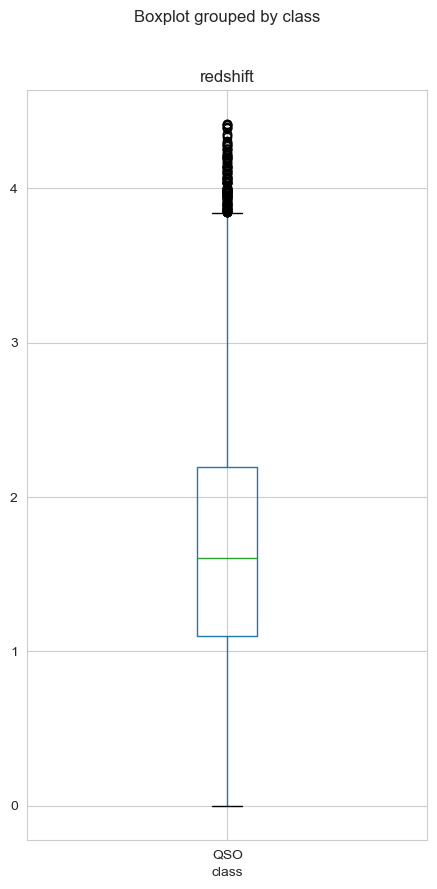

In [14]:
df_std.boxplot(column = 'redshift',by='class',figsize=(5,10))

In [15]:
df = df[df['redshift'] < 4.461539]

In [16]:
df

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,1.237679e+18,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,7778,301,2,581,1.055431e+19,GALAXY,0.000000,9374,57749,438
99996,1.237679e+18,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,7917,301,1,289,8.586351e+18,GALAXY,0.404895,7626,56934,866
99997,1.237668e+18,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,5314,301,4,308,3.112008e+18,GALAXY,0.143366,2764,54535,74
99998,1.237661e+18,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,3650,301,4,131,7.601080e+18,GALAXY,0.455040,6751,56368,470


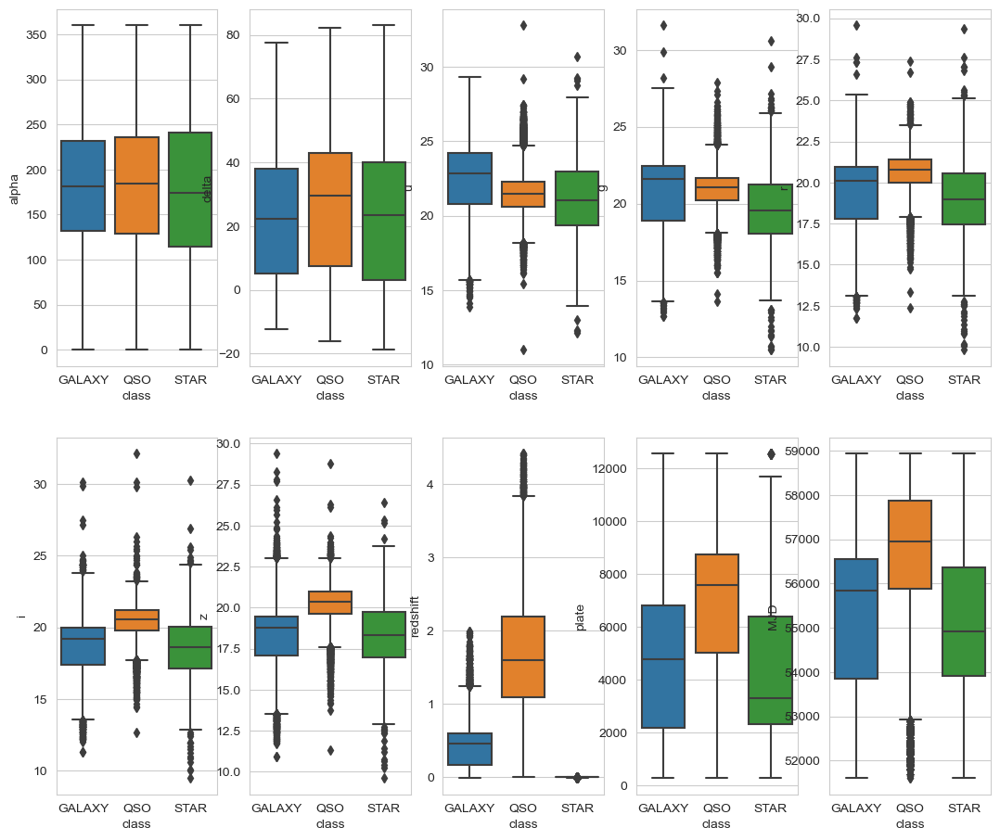

In [17]:
sns.set_style("whitegrid")
plt.figure(figsize=(13,11)) 
for i in range(1,11):
    f=plt.subplot(2,5,i)
    sns.boxplot(x = 'class', y = predictor_variables[i-1], data = df)

## Dealing with Imbalancing

<AxesSubplot:title={'center':'Class Distribution Before Oversampling'}, ylabel='class'>

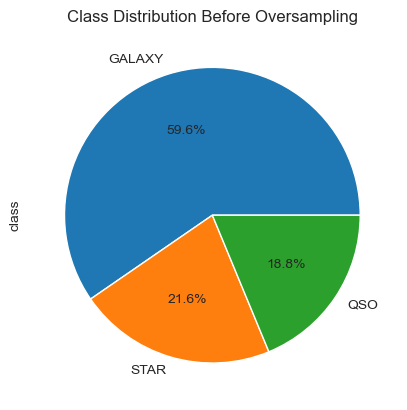

In [35]:
# Pie chart by class
df["class"].value_counts().plot(kind='pie',autopct='%1.1f%%',title="Class Distribution Before Oversampling")

## Train and Test Split

In [97]:
# Set up train and test split
X = df[predictor_variables]
y = df[response_variables]
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, train_size=0.8, stratify=y, random_state=0)
y=np.ravel(y)
print("Shape of X and y")
print(X.shape,y.shape)
print("Shape of test split")
print(Xtest.shape,ytest.shape)
print("Shape of train split")
print(Xtrain.shape,ytrain.shape)

Shape of X and y
(99743, 10) (99743,)
Shape of test split
(19949, 10) (19949, 1)
Shape of train split
(79794, 10) (79794, 1)


## SMOTE

In [41]:
print("Before OverSampling, counts of label 'GALAXY': {}".format(sum(ytrain == "GALAXY")))
print("Before OverSampling, counts of label 'QSO': {}".format(sum(ytrain == "QSO")))
print("Before OverSampling, counts of label 'STAR': {} \n".format(sum(ytrain == "STAR")))

Before OverSampling, counts of label 'GALAXY': 47556
Before OverSampling, counts of label 'QSO': 15169
Before OverSampling, counts of label 'STAR': 17275 



        class
0         QSO
1         QSO
2      GALAXY
3      GALAXY
4      GALAXY
...       ...
79995  GALAXY
79996    STAR
79997     QSO
79998     QSO
79999  GALAXY

[80000 rows x 1 columns]
<class 'pandas.core.frame.DataFrame'>


<AxesSubplot:title={'center':'Class Distribution of Train Set Before Oversampling'}, ylabel='class'>

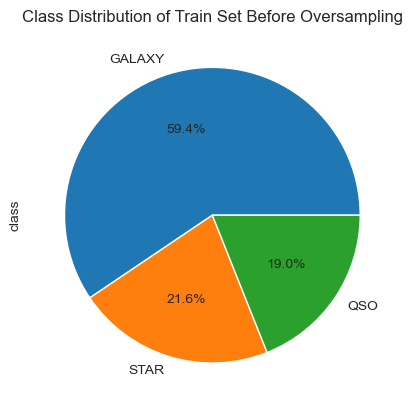

In [42]:
df_ytrain = pd.DataFrame(ytrain, columns = ['class'])

print(df_ytrain)
print(type(df_ytrain))

df_ytrain['class'].value_counts().plot(kind='pie',autopct='%1.1f%%',title="Class Distribution of Train Set Before Oversampling")

In [43]:
# using oversampling with SMOTE to deal with imbalanced data
sm = SMOTE(random_state=0)
Xtrain, ytrain = sm.fit_resample(Xtrain, ytrain)

In [44]:
print("After OverSampling, counts of label 'GALAXY': {}".format(sum(ytrain == "GALAXY")))
print("After OverSampling, counts of label 'QSO': {}".format(sum(ytrain == "QSO")))
print("After OverSampling, counts of label 'STAR': {} \n".format(sum(ytrain == "STAR")))

After OverSampling, counts of label 'GALAXY': 47556
After OverSampling, counts of label 'QSO': 47556
After OverSampling, counts of label 'STAR': 47556 



         class
0          QSO
1          QSO
2       GALAXY
3       GALAXY
4       GALAXY
...        ...
142663    STAR
142664    STAR
142665    STAR
142666    STAR
142667    STAR

[142668 rows x 1 columns]
<class 'pandas.core.frame.DataFrame'>


<AxesSubplot:title={'center':'Class Distribution of Train Set After Oversampling'}, ylabel='class'>

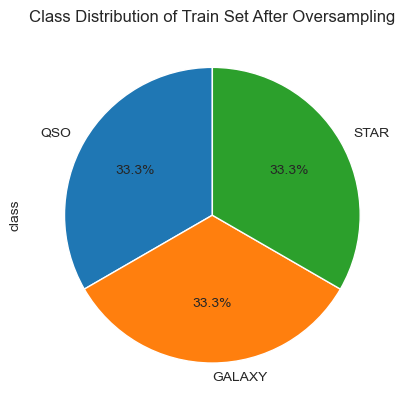

In [46]:
df_ytrain = pd.DataFrame(ytrain, columns = ['class'])

print(df_ytrain)
print(type(df_ytrain))

df_ytrain['class'].value_counts().plot(kind='pie',autopct='%1.1f%%',startangle=90,title="Class Distribution of Train Set After Oversampling")

## Quick Test

In [98]:
#Label Encoder
ytrain = np.ravel(ytrain)
ytrain = LabelEncoder().fit_transform(ytrain)
ytest = np.ravel(ytest)
ytest = LabelEncoder().fit_transform(ytest)
print(ytrain,ytest)

[0 0 0 ... 0 0 1] [0 2 1 ... 2 0 0]


LogisticRegression: 0.7524687954283422
KNeighborsClassifier: 0.797633966614868
BaggingClassifier: 0.9782946513609705
XGBClassifier: 0.9799989974434808
DecisionTreeClassifier: 0.9669156348689157
RandomForestClassifier: 0.9796982304877437
LinearSVC: 0.734573161561983
SVC: 0.5959697227931224
MLPClassifier: 0.3606697077547747
GradientBoostingClassifier: 0.9770414557120658


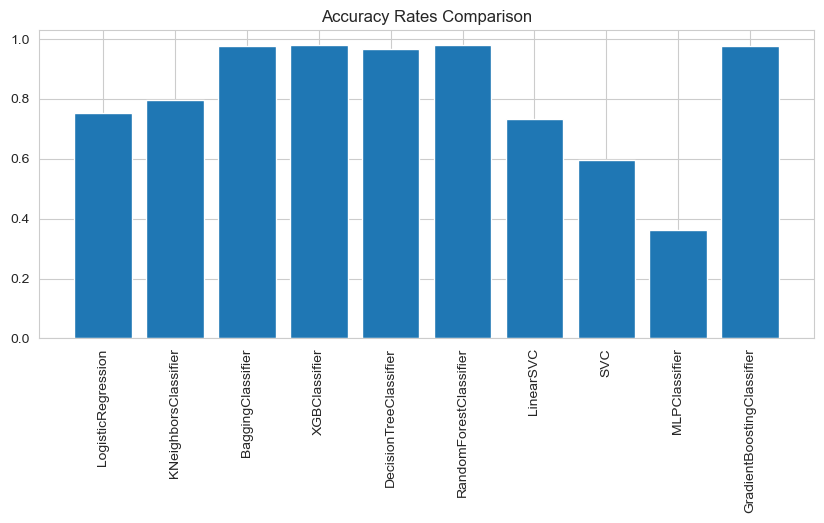

In [99]:
def quickTest(X, y, clf):
    
    clf.fit(Xtrain, ytrain)
    ypred = clf.predict(Xtest)
    print(type(clf).__name__ + ":", accuracy_score(ytest, ypred))
    return type(clf).__name__, accuracy_score(ytest, ypred)

names = [""] * 10
accuracies = [0] * 10


names[0], accuracies[0] = quickTest(X, y, LogisticRegression(solver='liblinear')) #solver='liblinear'

names[1], accuracies[1] = quickTest(X, y, KNeighborsClassifier()) # n_neighbors = 5

names[2], accuracies[2] = quickTest(X, y, BaggingClassifier()) # n_estimators=7, max_samples=0.2

names[3], accuracies[3] = quickTest(X, y, XGBClassifier()) 

names[4], accuracies[4] = quickTest(X, y, DecisionTreeClassifier()) #max_depth = 5
 
names[5], accuracies[5] = quickTest(X, y, RandomForestClassifier()) #n_estimators = 5, max_depth = 3

names[6], accuracies[6] = quickTest(X, y, LinearSVC(max_iter = 15000, dual=False)) # max_iter = 15000, dual=False, C = 1.0 

names[7], accuracies[7] = quickTest(X, y, SVC()) #gamma = "auto"

names[8], accuracies[8] = quickTest(X, y, MLPClassifier(hidden_layer_sizes = (20,),max_iter = 10000))# architecture parameters

names[9], accuracies[9] = quickTest(X, y, GradientBoostingClassifier()) #n_estimators = 5, max_depth = 3, learning_rate=0.2

#names[0], accuracies[0] = quickTest(X, y, MultinomialNB()) #alpha = 1.0

#names[0], accuracies[0] = quickTest(X, y, GaussianNB()) 

plt.figure(figsize = (10, 4))
plt.bar(list(range(len(accuracies))), accuracies)
plt.xticks(list(range(len(accuracies))), names, rotation = "vertical")
plt.title('Accuracy Rates Comparison')
plt.show()

## Min-Max Scaler

Xtrain = MinMaxScaler().fit_transform(Xtrain)
Xtest = MinMaxScaler().fit_transform(Xtest)
print(Xtrain,Xtest)

## Cross Validation

In [100]:
# Set up the k-fold cross-validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)

## XGBC Hyperparameter Optimization

### Initialize domain space for range of values

In [101]:
space={'max_depth': hp.quniform("max_depth", 3, 18, 1),
        'learning_rate': [0.1,0.2, 0.3, 0.5, 0.7],
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 0,20,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

### Define objective function;

In [102]:
def objective(space):
    clf=xgb.XGBClassifier(
                    n_estimators =space['n_estimators'], 
                    max_depth = int(space['max_depth']), 
                    gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),
                    min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']),
                    n_jobs=-1)
    
    evaluation = [( Xtrain, ytrain), ( Xtest, ytest)]
    
    clf.fit(Xtrain, ytrain,
            eval_set=evaluation,
            verbose=0)
    

    pred = clf.predict(Xtest)
    accuracy = accuracy_score(ytest, pred)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

### Optimization algorithm

In [103]:
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

SCORE:                                                                          
0.9748859591959497                                                              
SCORE:                                                                          
0.9747355757180811                                                              
SCORE:                                                                          
0.9747355757180811                                                              
SCORE:                                                                          
0.9749862148478621                                                              
SCORE:                                                                          
0.974685447892125                                                               
SCORE:                                                                          
0.9744849365883002                                                              
SCORE:                      

### Result

In [104]:
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

The best hyperparameters are :  

{'colsample_bytree': 0.5871821709746153, 'gamma': 2.1813625840247277, 'max_depth': 8.0, 'min_child_weight': 0.0, 'reg_alpha': 0.0, 'reg_lambda': 0.40597202680211114}


In [115]:
accuracy_bo=0.9757882600631611

## XGBC Default

In [107]:
xgbc_def=XGBClassifier(seed=0)
xgbc_def.fit(Xtrain, ytrain)
ypred = xgbc_def.predict(Xtest)
accuracy_def=accuracy_score(ytest, ypred)
print(type(xgbc_def).__name__ + " Default Score:", "%.5f" % accuracy_def)
print(xgbc_def.get_xgb_params())

XGBClassifier Default Score: 0.98000
{'objective': 'multi:softprob', 'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'eval_metric': None, 'gamma': 0, 'gpu_id': -1, 'grow_policy': 'depthwise', 'interaction_constraints': '', 'learning_rate': 0.300000012, 'max_bin': 256, 'max_cat_threshold': 64, 'max_cat_to_onehot': 4, 'max_delta_step': 0, 'max_depth': 6, 'max_leaves': 0, 'min_child_weight': 1, 'monotone_constraints': '()', 'n_jobs': 0, 'num_parallel_tree': 1, 'predictor': 'auto', 'random_state': 0, 'reg_alpha': 0, 'reg_lambda': 1, 'sampling_method': 'uniform', 'scale_pos_weight': None, 'subsample': 1, 'tree_method': 'exact', 'validate_parameters': 1, 'verbosity': None, 'seed': 0}


## XGBC Random and Grid Search

### Random Search

In [108]:
xgbParam_dist = { 
    # Learning rate shrinks the weights to make the boosting process more conservative
    "learning_rate": [0.1,0.2, 0.3, 0.5, 0.7] ,
    # Maximum depth of the tree, increasing it increases the model complexity.
    "max_depth": [3,4, 6, 8, 9],
    # Gamma specifies the minimum loss reduction required to make a split.
    "gamma": [0, 0.1,0.2, 0.3],
    # Percentage of columns to be randomly samples for each tree.
    "colsample_bytree": [0.01, 0.1, 0.3, 0.5, 1],
    # reg_alpha provides l1 regularization to the weight, higher values result in more conservative models
    "reg_alpha": [0, 0.1, 1, 3, 5],
    # reg_lambda provides l2 regularization to the weight, higher values result in more conservative models
    "reg_lambda": [0.5, 1, 5]}

xgbc_rnd = RandomizedSearchCV(XGBClassifier(eval_metric='logloss'), 
                           param_distributions=xgbParam_dist,
                           scoring="neg_log_loss",
                           n_iter=50,
                           n_jobs=-1, 
                           cv=cv, 
                           verbose=0
                         )

xgbc_rnd.fit(Xtrain, ytrain)

pred_rnd = xgbc_rnd.predict(Xtest)
accuracy_rnd = accuracy_score(ytest, pred_rnd)
print(type(xgbc_rnd).__name__ + " Random Search Score:", "%.5f" % accuracy_rnd)
print(f'The best hyperparameters for Random Search are {xgbc_rnd.best_params_}')

RandomizedSearchCV Random Search Score: 0.98025
The best hyperparameters for Random Search are {'reg_lambda': 5, 'reg_alpha': 0, 'max_depth': 8, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 0.5}


Text(0.5, 1.0, 'Confusion Matrix for XGBC with Random Search')

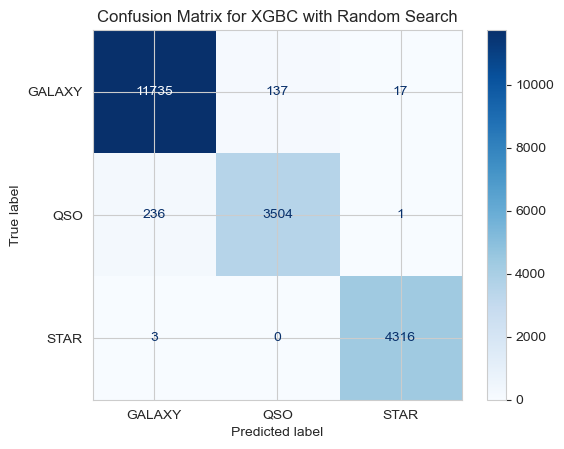

In [109]:
ConfusionMatrixDisplay.from_predictions(ytest, pred_rnd, cmap = plt.cm.Blues, 
                                        normalize = None, display_labels = ['GALAXY', 'QSO', 'STAR'])
plt.title("Confusion Matrix for XGBC with Random Search")

In [110]:
print(classification_report(ytest, pred_rnd))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     11889
           1       0.96      0.94      0.95      3741
           2       1.00      1.00      1.00      4319

    accuracy                           0.98     19949
   macro avg       0.98      0.97      0.98     19949
weighted avg       0.98      0.98      0.98     19949



### Grid Search

In [111]:
xgbParam_grid = { 
    # Percentage of columns to be randomly samples for each tree.
    "colsample_bytree": [0.01, 0.1, 0.3, 0.5, 1],
    # reg_alpha provides l1 regularization to the weight, higher values result in more conservative models
    "reg_alpha": [0, 0.1, 1, 3, 5],
    # reg_lambda provides l2 regularization to the weight, higher values result in more conservative models
    "reg_lambda": [0, 0.5, 1, 5]
                }

xgbc_grid = GridSearchCV(XGBClassifier(eval_metric='logloss'), 
                           param_grid=xgbParam_grid, 
                           scoring="neg_log_loss",
                           n_jobs=-1, 
                           cv=cv, 
                           verbose=0)

xgbc_grid.fit(Xtrain, ytrain)

pred = xgbc_grid.predict(Xtest)
accuracy_grid = accuracy_score(ytest, pred)
print(type(xgbc_grid).__name__ + " Grid Search Score:", "%.5f" % accuracy_grid)
print(f'The best hyperparameters for Grid Search are {xgbc_grid.best_params_}')

GridSearchCV Grid Search Score: 0.97970
The best hyperparameters for Grid Search are {'colsample_bytree': 0.5, 'reg_alpha': 5, 'reg_lambda': 1}


In [116]:
xgbc_model_names=[]
xgbc_model_names.append("XGBC Default")
xgbc_model_names.append("XGBC Grid Search")
xgbc_model_names.append("XGBC Random Search")
xgbc_model_names.append("XGBC Bayesian Optimization")
print(xgbc_model_names)

['XGBC Default', 'XGBC Grid Search', 'XGBC Random Search', 'XGBC Bayesian Optimization']


In [117]:
xgbc_model_accuracies=[]
xgbc_model_accuracies.append(float("{:.4f}".format(accuracy_def*100)))
xgbc_model_accuracies.append(float("{:.4f}".format(accuracy_grid*100)))
xgbc_model_accuracies.append(float("{:.4f}".format(accuracy_rnd*100)))
xgbc_model_accuracies.append(float("{:.4f}".format(accuracy_bo*100)))
print(xgbc_model_accuracies)

[97.9999, 97.9698, 98.025, 97.5788]


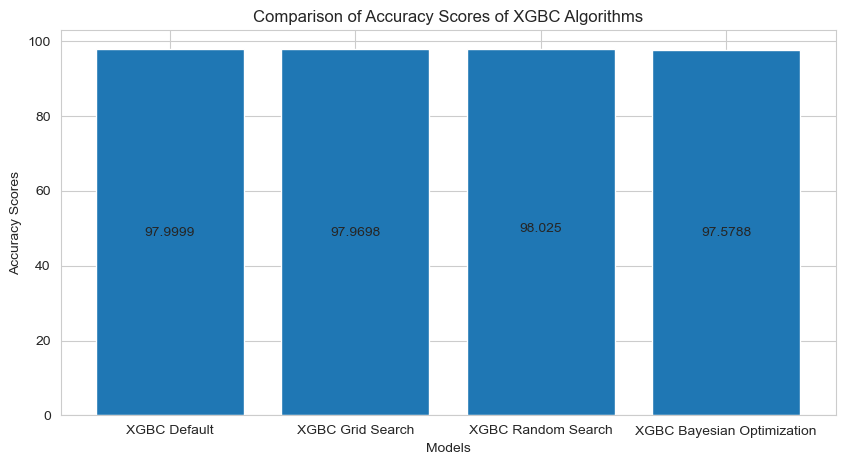

In [118]:
# function to add value labels
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i, y[i]//2, y[i], ha = 'center')
  

    
# creating data on which bar chart will be plot
x = xgbc_model_names
y = xgbc_model_accuracies
      
# setting figure size by using figure() function 
plt.figure(figsize = (10, 5))
      
# making the bar chart on the data
plt.bar(x, y)
      
# calling the function to add value labels
addlabels(x, y)
      
# giving title to the plot
plt.title("Comparison of Accuracy Scores of XGBC Algorithms")
      
# giving X and Y labels
plt.xlabel("Models")
plt.ylabel("Accuracy Scores")
      
# visualizing the plot
plt.show()

## RF

In [119]:
rfParams = {"n_estimators" : [5, 10, 25], #5, 10, 25, 50, 75, 100
            "max_depth": [3,4,5,6,7,8], #3,4,5,6,7,8,None
            "max_features": sp_randint(1, 6),
            "min_samples_split": sp_randint(2, 6),
            "bootstrap": [True, False],
            "criterion": ["gini", "entropy"]
           }

rf = RandomizedSearchCV(RandomForestClassifier(), 
                        rfParams, cv = cv, n_iter = 50)

rf.fit(Xtrain, ytrain)
pred = rf.predict(Xtest)
print("Picked Parameters:", rf.best_estimator_.max_depth, rf.best_estimator_.max_features,
      rf.best_estimator_.min_samples_split, rf.best_estimator_.bootstrap, rf.best_estimator_.criterion,
      rf.best_estimator_.n_estimators)
print("Random Forest Train Accuracy:", rf.score(Xtrain,ytrain))
print("Random Forest Test Accuracy:", rf.score(Xtest, ytest))

Picked Parameters: 8 5 4 False gini 10
Random Forest Train Accuracy: 0.9790209790209791
Random Forest Test Accuracy: 0.9769412000601534


## Bagging

In [120]:
#Fitting Bagging Classifier model with default hyper parameters
bagg = BaggingClassifier()
bagg.fit(Xtrain,ytrain)
pred_bagg = bagg.predict(Xtest)

In [121]:
#Checking different metrics for bagging model with default hyper parameters
print('Checking different metrics for bagging model with default hyper parameters:\n')
print("Training accuracy: ",bagg.score(Xtrain,ytrain))
acc_score = accuracy_score(ytest, pred_bagg)
print('Testing accuracy: ',acc_score)

Checking different metrics for bagging model with default hyper parameters:

Training accuracy:  0.9973306263628844
Testing accuracy:  0.9785452904907515


In [122]:
print('Selected parameters for default model:\n')
print(bagg.get_params())

Selected parameters for default model:

{'base_estimator': None, 'bootstrap': True, 'bootstrap_features': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 10, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


In [123]:
#Setting values for the parameters
n_estimators = [5, 10, 50, 100, 200]
max_depth = [5, 10, 15, 25, 30]
max_samples = [1, 50, 100, 300]
max_features = [1, 2, 5, 10]

#Creating a dictionary for the hyper parameters
hyperbag = dict(n_estimators = n_estimators, max_samples = max_samples, 
              max_features = max_features)

#Applying GridSearchCV to get the best value for hyperparameters
gridbag = GridSearchCV(bagg, hyperbag, cv = cv, verbose = 0, n_jobs = None)
bestbag = gridbag.fit(Xtrain, ytrain)

#Printing the best hyperparameters
print('The best hyper parameters are:\n',gridbag.best_params_)

The best hyper parameters are:
 {'max_features': 5, 'max_samples': 300, 'n_estimators': 100}


In [124]:
#Fitting the bagging model with the best hyper parameters obtained through GridSearchCV
bagg1 = BaggingClassifier(n_estimators = 200, max_samples = 300, 
              max_features = 5)
bagg1.fit(Xtrain,ytrain)
pred_bagg1 = bagg1.predict(Xtest)

In [125]:
#Checking different metrics for bagging model after tuning the hyperparameters
print('Checking different metrics for bagging model after tuning the hyperparameters:\n')
print("Training accuracy: ",bagg1.score(Xtrain,ytrain))
acc_score = accuracy_score(ytest, pred_bagg1)
print('Testing accuracy: ',acc_score)

Checking different metrics for bagging model after tuning the hyperparameters:

Training accuracy:  0.9634558989397699
Testing accuracy:  0.9612511905358665
